In [37]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap

In [39]:
conn = sqlite3.connect("usa_pollution.db") 

In [41]:
cursor = conn.cursor()

# Create locations table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS locations (
        id INTEGER PRIMARY KEY AUTOINCREMENT,
        state TEXT NOT NULL,
        county TEXT NOT NULL,
        city TEXT NOT NULL,
        latitude REAL NOT NULL,
        longitude REAL NOT NULL
    )
''')

In [43]:
# Create pollutants table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS pollutants (
        id INTEGER PRIMARY KEY AUTOINCREMENT,
        location INTEGER NOT NULL,
        year INTEGER NOT NULL,
        month INTEGER NOT NULL,
        day INTEGER NOT NULL,
        o3_mean REAL,
        o3_max_value REAL,
        o3_first_max_hour REAL,
        o3_aqi REAL,
        co_mean REAL,
        co_max_value REAL,
        co_first_max_hour REAL,
        co_aqi REAL,
        so2_mean REAL,
        so2_max_value REAL,
        so2_first_max_hour REAL,
        so2_aqi REAL,
        no2_mean REAL,
        no2_max_value REAL,
        no2_first_max_hour REAL,
        no2_aqi REAL,
        FOREIGN KEY(location) REFERENCES locations(id)
    )
''')

In [45]:
conn.commit()

In [47]:
# Example SQL Query: Average O3 AQI per State
query = """
SELECT l.state, AVG(p.o3_aqi) as avg_o3_aqi
FROM pollutants p
JOIN locations l ON p.location = l.id
GROUP BY l.state
ORDER BY avg_o3_aqi DESC
LIMIT 10;
"""

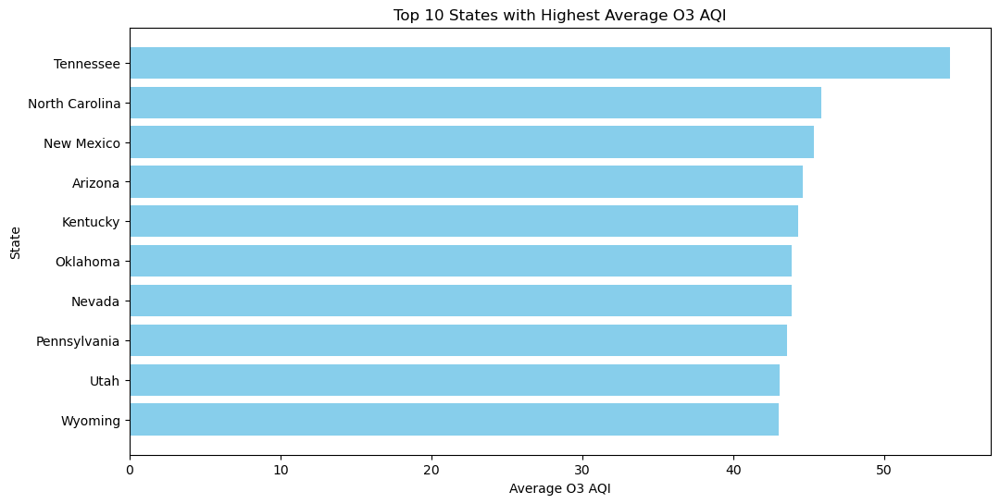

In [49]:
# Execute the query and load the results into a Pandas DataFrame
df_sql = pd.read_sql_query(query, conn)

#Visualize the results
plt.figure(figsize=(12, 6))
plt.barh(df_sql["state"], df_sql["avg_o3_aqi"], color="skyblue")
plt.xlabel("Average O3 AQI")
plt.ylabel("State")
plt.title("Top 10 States with Highest Average O3 AQI")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

In [51]:
# SQL Query to fetch pollution data with latitude & longitude
query = """
SELECT l.latitude, l.longitude, p.o3_aqi
FROM pollutants p
JOIN locations l ON p.location = l.id
WHERE p.o3_aqi IS NOT NULL;
"""

In [53]:
# Execute the query and load data into Pandas DataFrame
df_heatmap = pd.read_sql_query(query, conn)

In [57]:
# Create a base map centered in the USA
m = folium.Map(location=[37.0902, -95.7129], zoom_start=5)

# Add HeatMap layer
heat_data = df_heatmap[["latitude", "longitude", "o3_aqi"]].values.tolist()
HeatMap(heat_data, radius=15, blur=25, max_zoom=1).add_to(m)

# Display the map
m

In [ ]:
conn.close()